# Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import random
import os
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from tensorflow import keras
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
import tensorflow_hub as hub
from tensorflow import keras
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import (Input, Conv2D, AveragePooling2D, Flatten, Dense, Concatenate,
                                     Rescaling, MaxPooling2D, BatchNormalization, Dropout, Add,
                                     GlobalAveragePooling2D)
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.models import Model
from datetime import datetime as dt
from tensorflow.keras.callbacks import TensorBoard

In [2]:
! wget https://raw.githubusercontent.com/DriveMyScream/Python_libraries/main/helper_functions.py

--2023-09-14 20:22:39--  https://raw.githubusercontent.com/DriveMyScream/Python_libraries/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7752 (7.6K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]   7.57K  --.-KB/s    in 0s      

2023-09-14 20:22:39 (81.4 MB/s) - ‘helper_functions.py’ saved [7752/7752]



In [3]:
from helper_functions import (make_confusion_matrix, plot_loss_curves, calculate_results, plot_class_accuracy,
                              plot_random_misclassified_images, plot_prediction_confidence_histogram, create_tensorboard_callback)

In [81]:
def plot_loss_curves(history):
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])

    accuracy = np.array(history.history['top_k_accuracy'])
    val_accuracy = np.array(history.history['val_top_k_accuracy'])

    epochs = range(len(history.history['loss']))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.plot(epochs, loss, label='training_loss', marker='o')
    ax1.plot(epochs, val_loss, label='val_loss', marker='o')

    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)

    ax1.set_title('Loss (Lower Means Better)', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend()

    # Plot accuracy
    ax2.plot(epochs, accuracy, label='training_top_5_accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='val_top_5_accuracy', marker='o')

    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)

    ax2.set_title('Accuracy (Higher Means Better)', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend();

# Data Downloading

In [5]:
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 /root/.kaggle/kaggle.json
! kaggle datasets download -d viktormodroczky/facial-affect-dataset-relabeled-unbalanced
! unzip "/content/facial-affect-dataset-relabeled-unbalanced.zip" -d "/content/dataset"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/train/sad/image0017170.jpg  
  inflating: /content/dataset/train/sad/image0017220.jpg  
  inflating: /content/dataset/train/sad/image0017238.jpg  
  inflating: /content/dataset/train/sad/image0017241.jpg  
  inflating: /content/dataset/train/sad/image0017246.jpg  
  inflating: /content/dataset/train/sad/image0017250.jpg  
  inflating: /content/dataset/train/sad/image0017271.jpg  
  inflating: /content/dataset/train/sad/image0017322.jpg  
  inflating: /content/dataset/train/sad/image0017323.jpg  
  inflating: /content/dataset/train/sad/image0017360.jpg  
  inflating: /content/dataset/train/sad/image0017380.jpg  
  inflating: /content/dataset/train/sad/image0017452.jpg  
  inflating: /content/dataset/train/sad/image0017453.jpg  
  inflating: /content/dataset/train/sad/image0017457.jpg  
  inflating: /content/dataset/train/sad/image0017468.jpg  
  inflating: /content/dataset/train/sad/image0017471.jpg  
  inf

# Data Loading

In [6]:
train_directory = "/content/dataset/train"
test_directory = "/content/dataset/test"

In [9]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [10]:
train_dataset = image_dataset_from_directory(
        train_directory,
        labels = 'inferred',
        label_mode = 'categorical',
        color_mode = 'rgb',
        batch_size = 64,
        image_size = (128, 128),
        shuffle = True,
        seed = 99)

Found 22930 files belonging to 8 classes.


In [11]:
test_dataset = image_dataset_from_directory(
        test_directory,
        labels = 'inferred',
        label_mode = 'categorical',
        color_mode = 'rgb',
        batch_size = 64,
        image_size = (128, 128),
        shuffle = True,
        seed = 99)

Found 5734 files belonging to 8 classes.


# Class weights

In [12]:
class_names = train_dataset.class_names
num_classes = len(class_names)
print("Total Number of Classes: ", num_classes)
print("Class Names:", class_names)

Total Number of Classes:  8
Class Names: ['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


In [13]:
subdirectories = [subdir for subdir in os.listdir(train_directory) if os.path.isdir(os.path.join(train_directory, subdir))]
subdirectories.sort()

image_counts = {}

for index, subdir in enumerate(subdirectories, start=0):
    subdirectory_path = os.path.join(train_directory, subdir)
    image_files = [filename for filename in os.listdir(subdirectory_path) if os.path.isfile(os.path.join(subdirectory_path, filename))]
    image_count = len(image_files)
    image_counts[index] = image_count

print("Image Count", image_counts)

Image Count {0: 3025, 1: 2638, 2: 2827, 3: 2590, 4: 3427, 5: 2257, 6: 2515, 7: 3651}


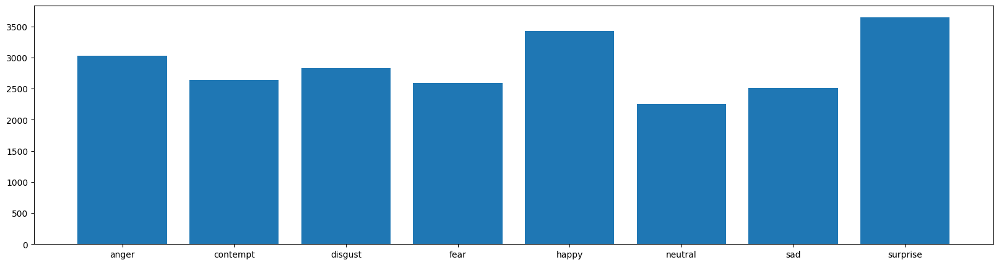

In [14]:
plt.figure(figsize=(20, 5))
image_index = class_names
image_count = list(image_counts.values())

plt.bar(range(len(image_counts)), image_count, tick_label=image_index)
plt.show();

In [15]:
total_number_images = 22930
class_weights = {}
for index, count in image_counts.items():
  class_weights[index] = total_number_images / count

print("class Weights: ", class_weights)

class Weights:  {0: 7.580165289256199, 1: 8.692191053828658, 2: 8.111071807569862, 3: 8.853281853281853, 4: 6.690983367376714, 5: 10.159503766061142, 6: 9.117296222664017, 7: 6.2804711038071765}


# Data Augumentation

In [16]:
from tensorflow.keras import Sequential

In [17]:
data_augmentation = Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2)
])

In [18]:
augumented_train_dataset = train_dataset.map(lambda x, y: (data_augmentation(x, training=True), y))

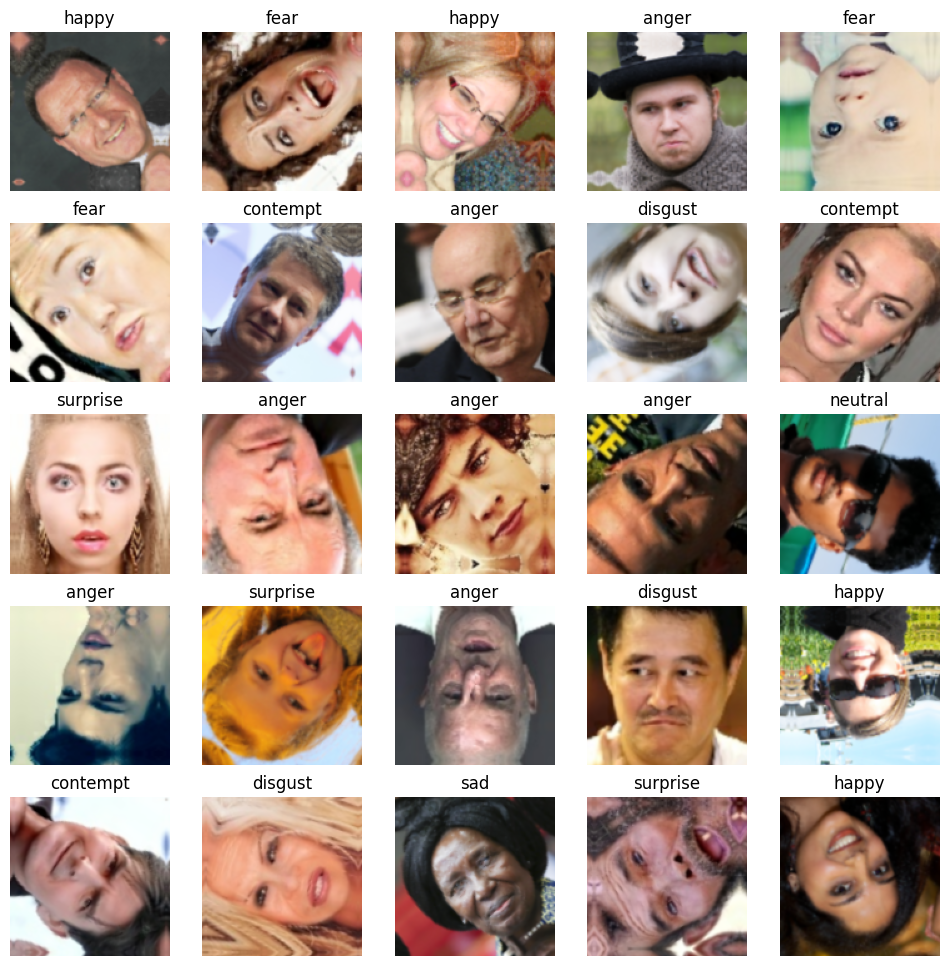

In [19]:
plt.figure(figsize=(12, 12))
for images, labels in augumented_train_dataset.take(1):
    for i in range(25):
        plt.subplot(5, 5, i+1, xticks=[], yticks=[])
        plt.imshow(images[i]/255)
        plt.title(class_names[tf.argmax(labels[i], axis=0)])
        plt.axis("off");

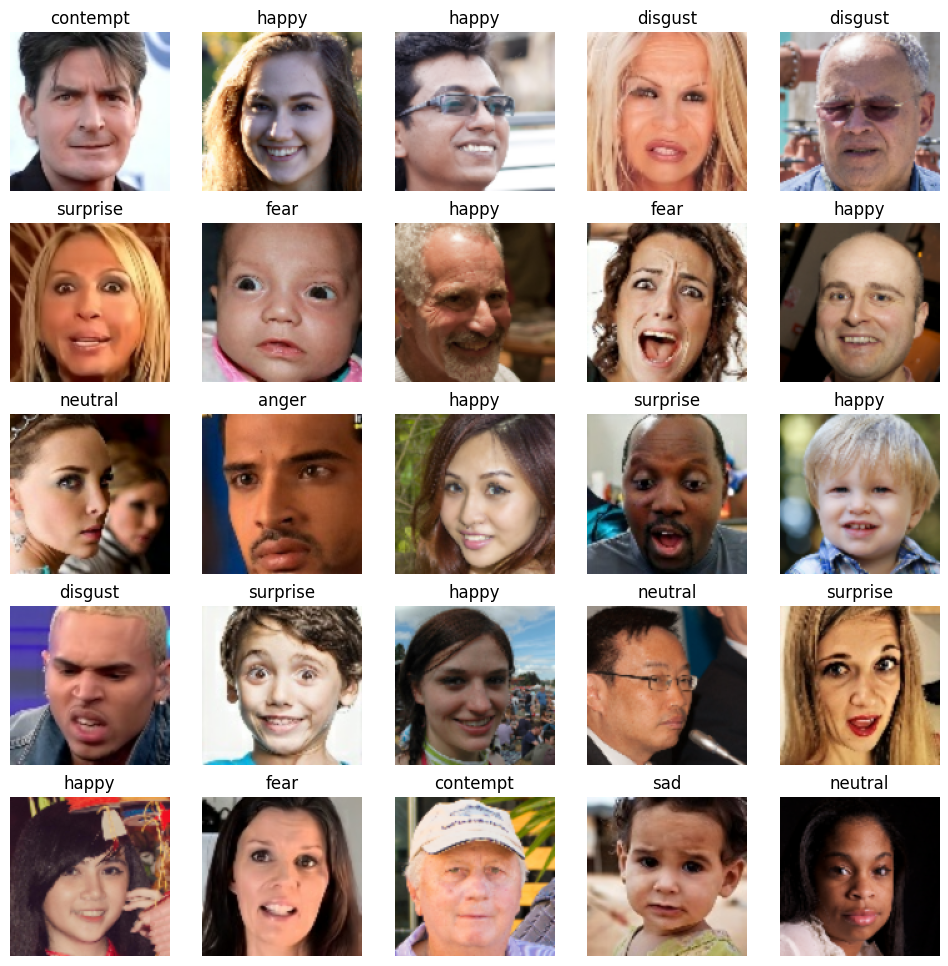

In [20]:
plt.figure(figsize=(12, 12))
for images, labels in train_dataset.take(1):
  for i in range(25):
    plt.subplot(5, 5, i+1, xticks=[], yticks=[])
    plt.imshow(images[i]/255)
    plt.title(class_names[tf.argmax(labels[i], axis=0)])
    plt.axis("off");

# Data Loading

In [21]:
print("Number of Training Examples in Training data:", len(train_dataset) * 64)
print("Number of Testing Examples in Testing data:", len(test_dataset) * 64)

Number of Training Examples in Training data: 22976
Number of Testing Examples in Testing data: 5760


In [22]:
train_dataset = (
    train_dataset
    .prefetch(tf.data.AUTOTUNE))

In [23]:
test_dataset = (
    test_dataset
    .prefetch(tf.data.AUTOTUNE))

# Tensorboard Callback

In [24]:
# Directory for tensorboard callback
os.mkdir("logs")

In [25]:
def create_tensorboard_callback(model_name):
    log_dir = os.path.join("logs", model_name + "_" + dt.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_callback = TensorBoard(log_dir=log_dir)
    return tensorboard_callback

# Vgg16 Model

In [26]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

base_model = VGG16(weights='imagenet', input_shape=(128, 128, 3), include_top=False)
base_model.trainable = False

input_layer = Input(shape=(128, 128, 3))
preprocess_layer = preprocess_input(input_layer)

x = base_model(preprocess_layer, training=False)

x = Flatten()(x)
x = Dense(units=512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dense(units=256, activation = "relu")(x)

output_layer = keras.layers.Dense(units=num_classes, activation='softmax')(x)

VGG16_model = keras.Model(inputs=input_layer,
                          outputs=output_layer)

VGG16_model.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 tf.__operators__.getitem (  (None, 128, 128, 3)       0         
 SlicingOpLambda)                                                
                                                                 
 tf.nn.bias_add (TFOpLambda  (None, 128, 128, 3)       0         
 )                                                               
                                                                 
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                              

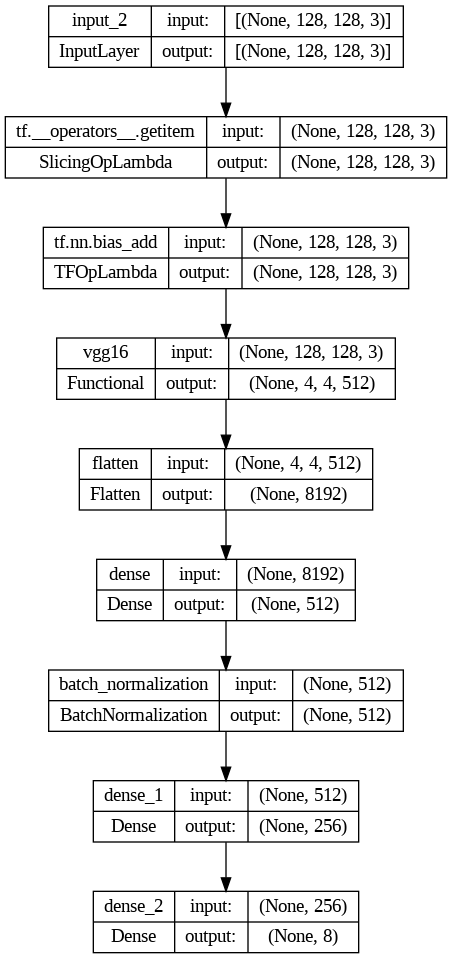

In [27]:
plot_model(VGG16_model, show_shapes=True)

In [30]:
def top_k_accuracy(y_true, y_pred, k=5):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=k)

In [32]:
VGG16_model.compile(optimizer = 'adam',
                    loss = 'categorical_crossentropy',
                    metrics = [top_k_accuracy])

In [33]:
VGG16_model_history = VGG16_model.fit(train_dataset,
                                      validation_data = test_dataset,
                                      callbacks = create_tensorboard_callback("VGG16_model"),
                                      class_weight = class_weights,
                                      epochs=5)

Epoch 1/5
359/359 [==============================] - 43s 113ms/step - loss: 13.6052 - top_k_accuracy: 0.8854 - val_loss: 1.6393 - val_top_k_accuracy: 0.8987
Epoch 2/5
359/359 [==============================] - 35s 98ms/step - loss: 9.8133 - top_k_accuracy: 0.9539 - val_loss: 1.7603 - val_top_k_accuracy: 0.8886
Epoch 3/5
359/359 [==============================] - 40s 110ms/step - loss: 6.8117 - top_k_accuracy: 0.9809 - val_loss: 2.0106 - val_top_k_accuracy: 0.8872
Epoch 4/5
359/359 [==============================] - 36s 101ms/step - loss: 4.5703 - top_k_accuracy: 0.9916 - val_loss: 2.3137 - val_top_k_accuracy: 0.8859
Epoch 5/5
359/359 [==============================] - 40s 110ms/step - loss: 3.1844 - top_k_accuracy: 0.9962 - val_loss: 2.5945 - val_top_k_accuracy: 0.8849


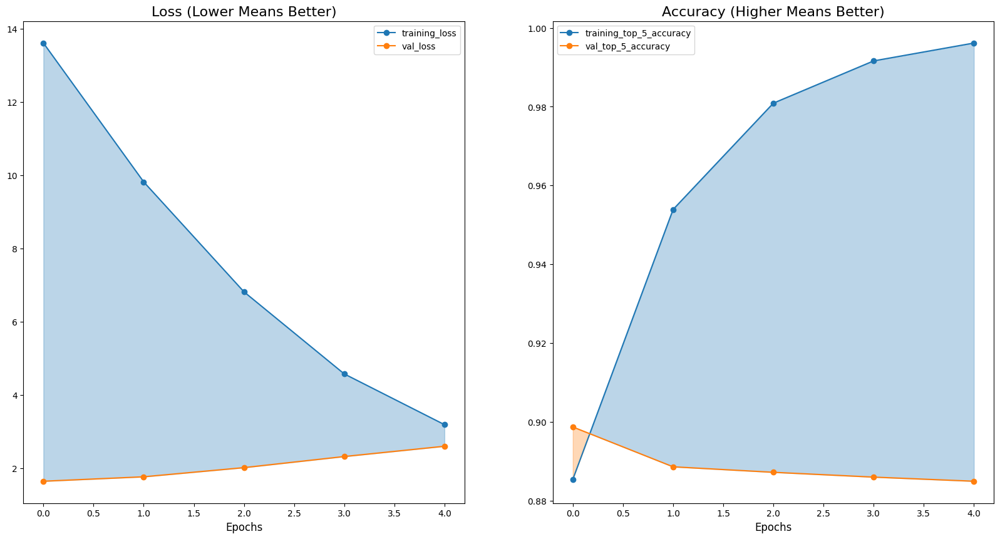

In [36]:
plot_loss_curves(VGG16_model_history)

## VGG16 Model error analysis

In [37]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in test_dataset:
    batch_predictions = VGG16_model.predict(batch_images)

    batch_predicted_labels = np.argmax(batch_predictions, axis=1)
    batch_labels = np.argmax(batch_labels, axis=1)

    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)


true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 1s 723ms/step


In [38]:
vgg16_model_results = calculate_results(y_true = true_labels,
                                        y_pred = predicted_labels)
vgg16_model_results

{'accuracy': 39.291942797349144,
 'precision': 0.40405534427009304,
 'recall': 0.39291942797349144,
 'f1': 0.39547921211637854}

Confusion Matrix:


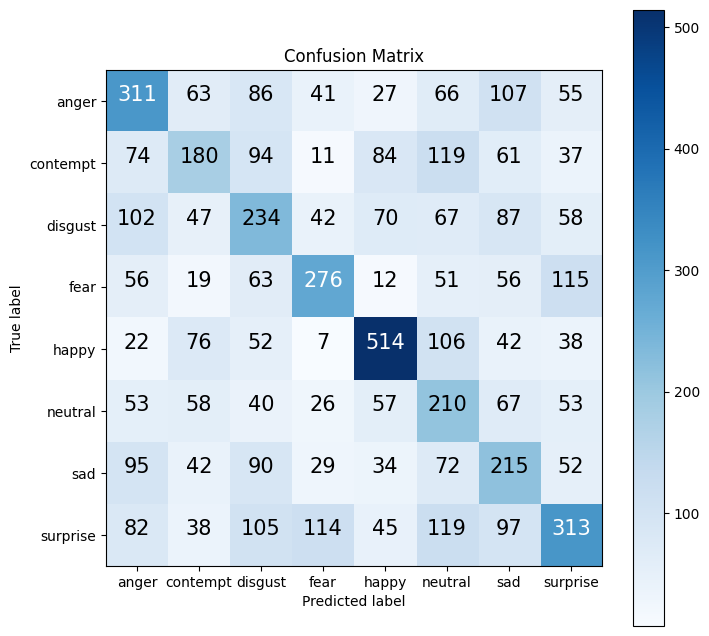

In [39]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names,
                      figsize=(8, 8))

In [40]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

           0       0.39      0.41      0.40       756
           1       0.34      0.27      0.30       660
           2       0.31      0.33      0.32       707
           3       0.51      0.43      0.46       648
           4       0.61      0.60      0.60       857
           5       0.26      0.37      0.31       564
           6       0.29      0.34      0.32       629
           7       0.43      0.34      0.38       913

    accuracy                           0.39      5734
   macro avg       0.39      0.39      0.39      5734
weighted avg       0.40      0.39      0.40      5734



ClassWise accuracy


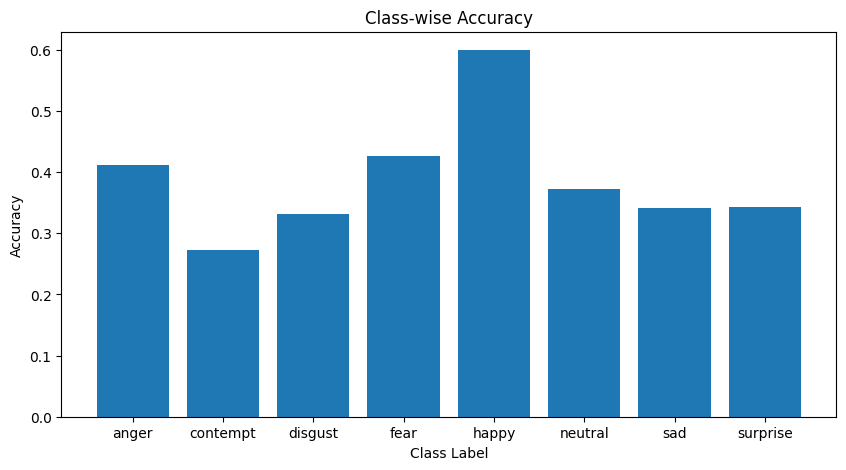

In [41]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names,
                    figsize=(10, 5))

Plot Misclassified images:


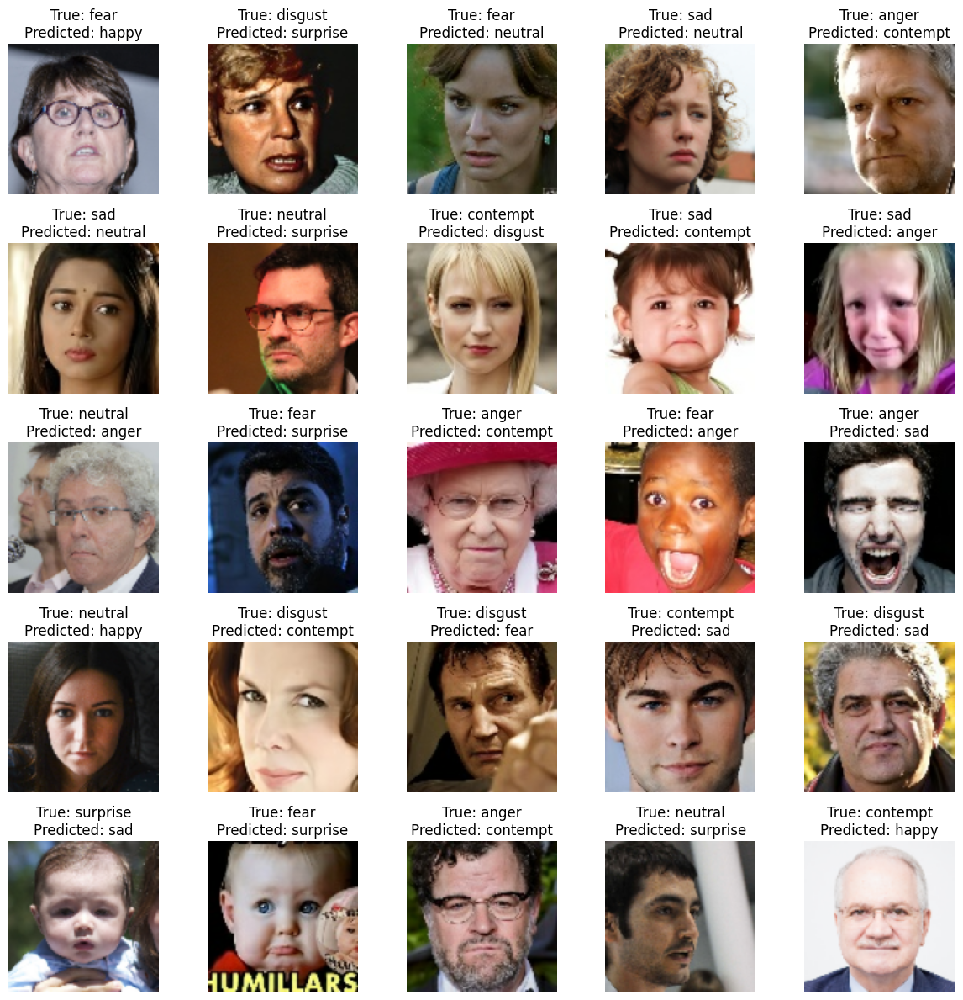

In [42]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Resnet 50 Model

In [43]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

base_model = ResNet50(weights='imagenet',
                      input_shape=(128, 128, 3),
                      include_top=False) # Do not include the ImageNet classifier at the top.
base_model.trainable = False

input_layer = Input(shape=(128, 128, 3))
preprocess_layer = preprocess_input(input_layer)

x = base_model(preprocess_layer, training=False)

x = GlobalAveragePooling2D()(x)
x = Dense(units=512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(units=256, activation = "relu")(x)

output_layer = Dense(units=num_classes, activation='softmax')(x)

Resnet50_model = Model(inputs=input_layer,
                       outputs=output_layer)

Resnet50_model.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 tf.__operators__.getitem_1  (None, 128, 128, 3)       0         
  (SlicingOpLambda)                                              
                                                                 
 tf.nn.bias_add_1 (TFOpLamb  (None, 128, 128, 3)       0         
 da)                                                             
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                    

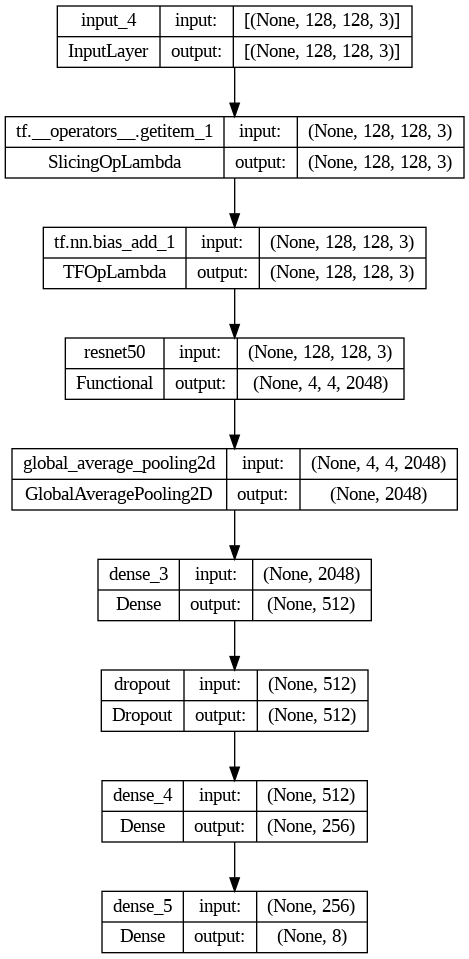

In [44]:
plot_model(Resnet50_model, show_shapes=True)

In [45]:
Resnet50_model.compile(optimizer='adam',
                      loss='categorical_crossentropy',
                      metrics=[top_k_accuracy])

In [46]:
Resnet50_model_history = Resnet50_model.fit(train_dataset,
                                            validation_data = test_dataset,
                                            callbacks = create_tensorboard_callback("Resnet50_model"),
                                            class_weight = class_weights,
                                            epochs=5)

Epoch 1/5
359/359 [==============================] - 39s 91ms/step - loss: 15.4669 - top_k_accuracy: 0.8122 - val_loss: 1.7512 - val_top_k_accuracy: 0.8668
Epoch 2/5
359/359 [==============================] - 32s 87ms/step - loss: 14.3734 - top_k_accuracy: 0.8518 - val_loss: 1.7008 - val_top_k_accuracy: 0.8812
Epoch 3/5
359/359 [==============================] - 35s 95ms/step - loss: 13.9885 - top_k_accuracy: 0.8625 - val_loss: 1.6668 - val_top_k_accuracy: 0.8880
Epoch 4/5
359/359 [==============================] - 30s 83ms/step - loss: 13.6091 - top_k_accuracy: 0.8771 - val_loss: 1.6480 - val_top_k_accuracy: 0.8992
Epoch 5/5
359/359 [==============================] - 40s 111ms/step - loss: 13.3128 - top_k_accuracy: 0.8856 - val_loss: 1.6201 - val_top_k_accuracy: 0.9030


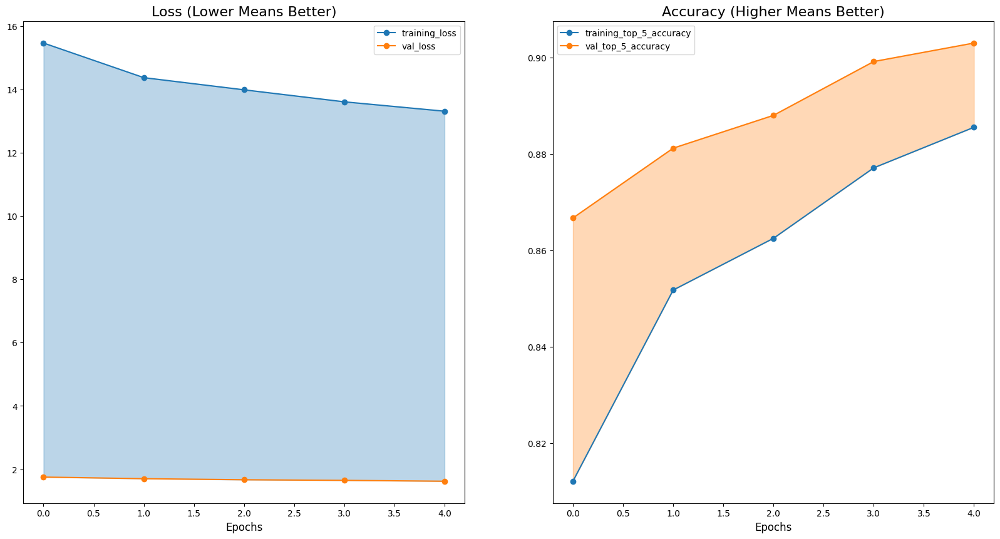

In [47]:
plot_loss_curves(Resnet50_model_history)

# Resnet50 Error Analysis

In [48]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in test_dataset:
    batch_predictions = Resnet50_model.predict(batch_images)

    batch_predicted_labels = np.argmax(batch_predictions, axis=1)
    batch_labels = np.argmax(batch_labels, axis=1)

    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)


true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 2s 637ms/step


In [49]:
Resnet50_model_results = calculate_results(y_true = true_labels,
                                           y_pred = predicted_labels)
Resnet50_model_results

{'accuracy': 41.070805720265085,
 'precision': 0.407517169396451,
 'recall': 0.41070805720265086,
 'f1': 0.3999633710333927}

Confusion Matrix:


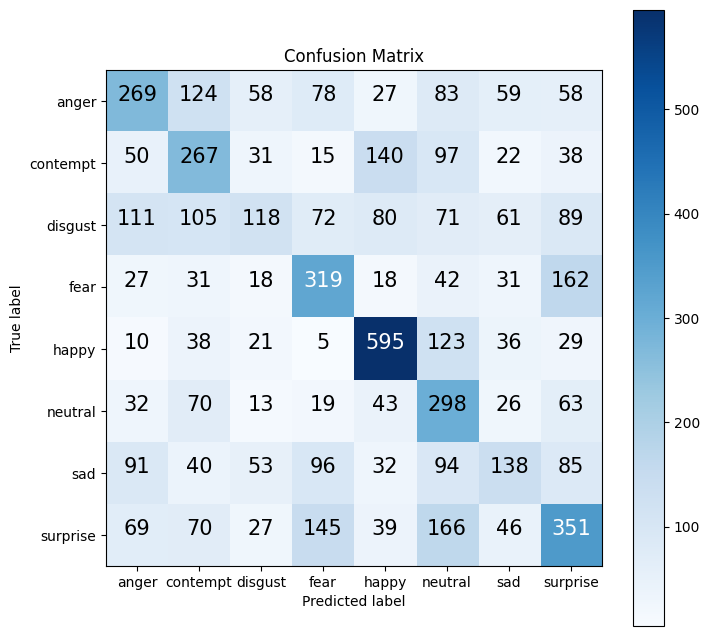

In [50]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names,
                      figsize=(8, 8))

In [51]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

           0       0.41      0.36      0.38       756
           1       0.36      0.40      0.38       660
           2       0.35      0.17      0.23       707
           3       0.43      0.49      0.46       648
           4       0.61      0.69      0.65       857
           5       0.31      0.53      0.39       564
           6       0.33      0.22      0.26       629
           7       0.40      0.38      0.39       913

    accuracy                           0.41      5734
   macro avg       0.40      0.41      0.39      5734
weighted avg       0.41      0.41      0.40      5734



ClassWise accuracy


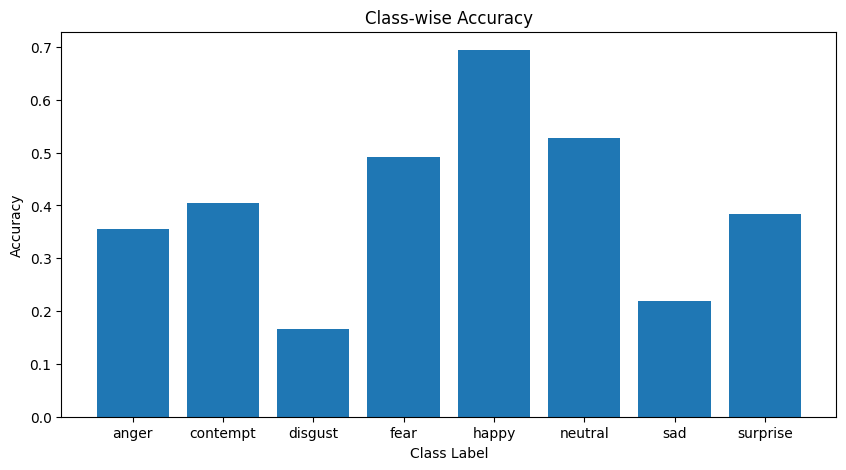

In [52]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names,
                    figsize = (10, 5))

Plot Misclassified images:


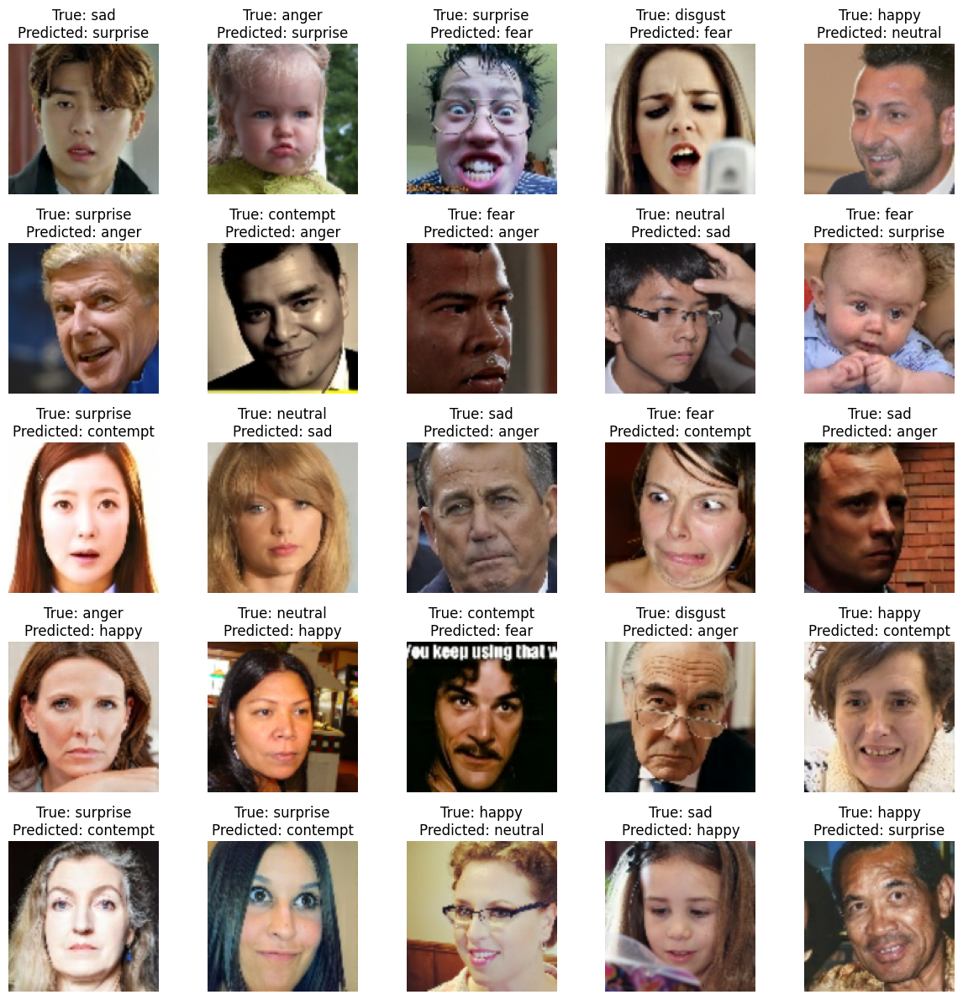

In [53]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Inceptionv3 Model

In [54]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input

base_model = InceptionV3(weights='imagenet',
                      input_shape=(128, 128, 3),
                      include_top=False) # Do not include the ImageNet classifier at the top.
base_model.trainable = False

input_layer = Input(shape=(128, 128, 3))
preprocess_layer = preprocess_input(input_layer)

x = base_model(preprocess_layer, training=False)

x = GlobalAveragePooling2D()(x)
x = Dense(units=512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(units=256, activation = "relu")(x)

output_layer = Dense(units=num_classes, activation='softmax')(x)

inceptionv3_model = Model(inputs=input_layer,
                          outputs=output_layer)

inceptionv3_model.summary()

87910968/87910968 [==============================] - 1s 0us/step
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambd  (None, 128, 128, 3)       0         
 a)                                                              
                                                                 
 tf.math.subtract (TFOpLamb  (None, 128, 128, 3)       0         
 da)                                                             
                                                                 
 inception_v3 (Functional)   (None, 2, 2, 2048)        21802784  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                  

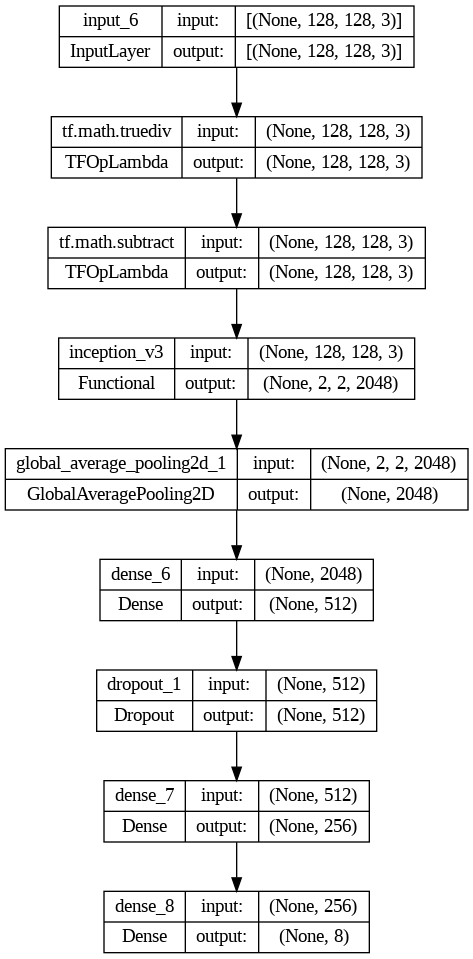

In [55]:
plot_model(inceptionv3_model, show_shapes=True)

In [56]:
inceptionv3_model.compile(optimizer='adam',
                          loss='categorical_crossentropy',
                          metrics=[top_k_accuracy])

In [57]:
inceptionv3_model_history = inceptionv3_model.fit(train_dataset,
                                                  validation_data = test_dataset,
                                                  callbacks = create_tensorboard_callback("inceptionv3_model"),
                                                  class_weight = class_weights,
                                                  epochs=5)

Epoch 1/5
359/359 [==============================] - 43s 93ms/step - loss: 16.1424 - top_k_accuracy: 0.7675 - val_loss: 1.8714 - val_top_k_accuracy: 0.8216
Epoch 2/5
359/359 [==============================] - 35s 95ms/step - loss: 15.2142 - top_k_accuracy: 0.8002 - val_loss: 1.8385 - val_top_k_accuracy: 0.8361
Epoch 3/5
359/359 [==============================] - 43s 118ms/step - loss: 15.0221 - top_k_accuracy: 0.8107 - val_loss: 1.8009 - val_top_k_accuracy: 0.8357
Epoch 4/5
359/359 [==============================] - 22s 61ms/step - loss: 14.7871 - top_k_accuracy: 0.8242 - val_loss: 1.7966 - val_top_k_accuracy: 0.8495
Epoch 5/5
359/359 [==============================] - 25s 68ms/step - loss: 14.6528 - top_k_accuracy: 0.8248 - val_loss: 1.8123 - val_top_k_accuracy: 0.8504


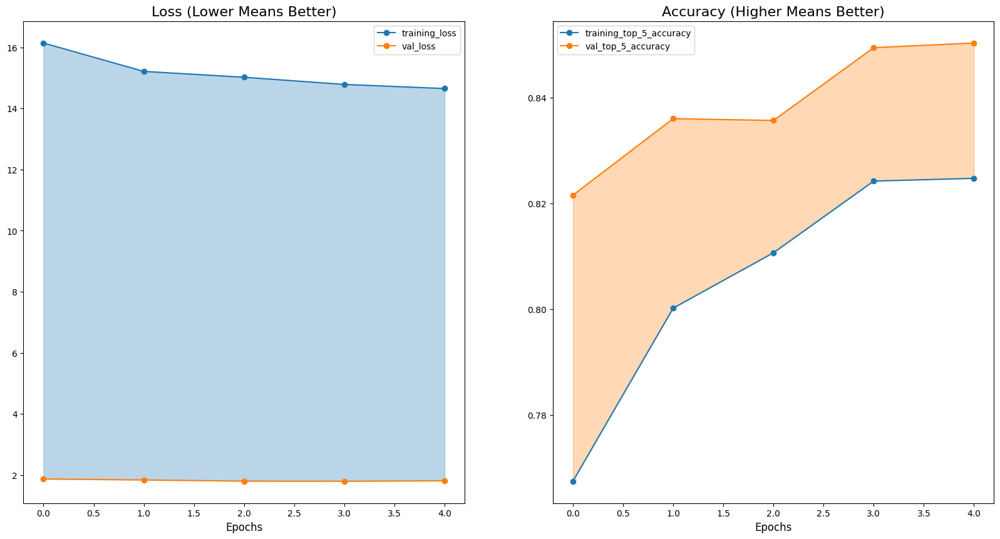

In [58]:
plot_loss_curves(inceptionv3_model_history)

In [59]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in test_dataset:
    batch_predictions = inceptionv3_model.predict(batch_images)

    batch_predicted_labels = np.argmax(batch_predictions, axis=1)
    batch_labels = np.argmax(batch_labels, axis=1)

    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)


true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 2s 899ms/step


In [60]:
inceptionv3_model_results = calculate_results(y_true = true_labels,
                                              y_pred = predicted_labels)
inceptionv3_model_results

{'accuracy': 33.60655737704918,
 'precision': 0.3156449954559686,
 'recall': 0.3360655737704918,
 'f1': 0.3178307163437221}

Confusion Matrix:


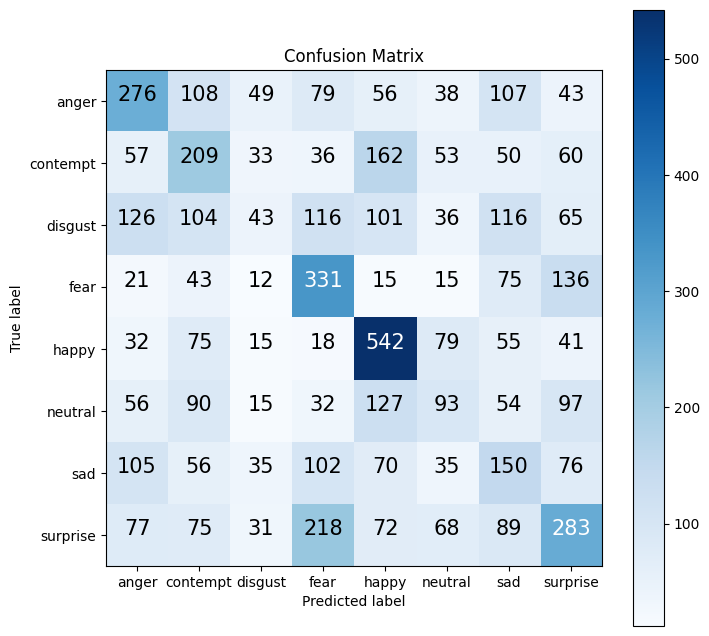

In [61]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names,
                      figsize=(8, 8))

In [62]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

           0       0.37      0.37      0.37       756
           1       0.28      0.32      0.29       660
           2       0.18      0.06      0.09       707
           3       0.36      0.51      0.42       648
           4       0.47      0.63      0.54       857
           5       0.22      0.16      0.19       564
           6       0.22      0.24      0.23       629
           7       0.35      0.31      0.33       913

    accuracy                           0.34      5734
   macro avg       0.31      0.32      0.31      5734
weighted avg       0.32      0.34      0.32      5734



ClassWise accuracy


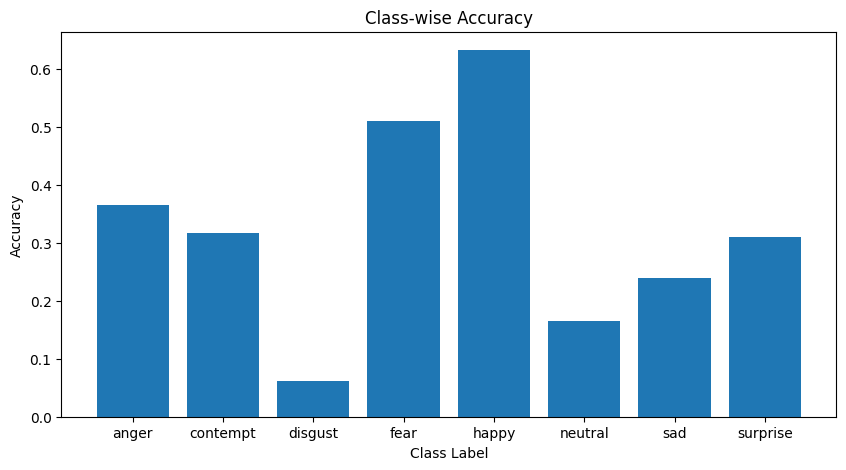

In [63]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names,
                    figsize = (10, 5))

Plot Misclassified images:


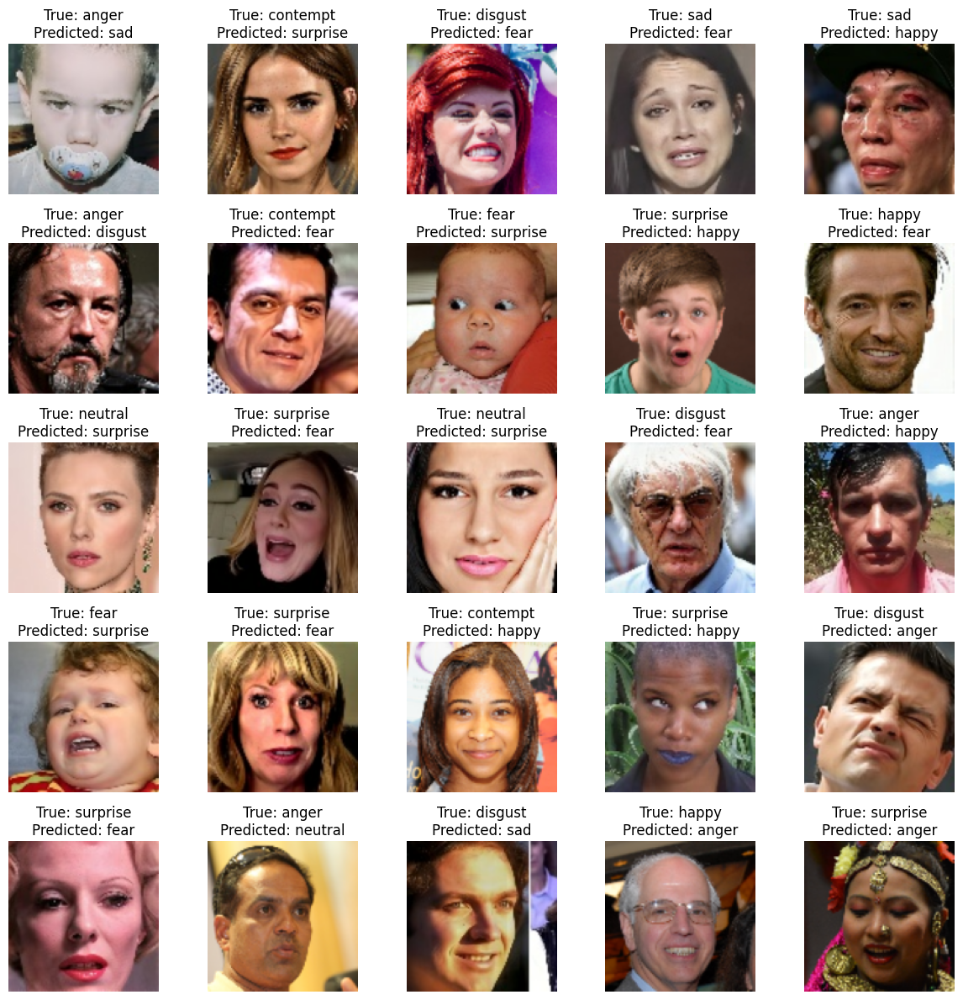

In [64]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# MobileNetV1 Model

In [65]:
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input


base_model = MobileNet(weights='imagenet', input_shape=(128, 128, 3), include_top=False) # Do not include the ImageNet classifier at the top.
base_model.trainable = False

input_layer = Input(shape=(128, 128, 3))
preprocess_layer = preprocess_input(input_layer)

x = base_model(preprocess_layer, training=False)

x = GlobalAveragePooling2D()(x)
x = Dense(units=512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(units=256, activation = "relu")(x)

output_layer = Dense(units=num_classes, activation='softmax')(x)

mobilenet_model = Model(inputs=input_layer,
                        outputs=output_layer)

mobilenet_model.summary()

17225924/17225924 [==============================] - 0s 0us/step
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 tf.math.truediv_1 (TFOpLam  (None, 128, 128, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_1 (TFOpLa  (None, 128, 128, 3)       0         
 mbda)                                                           
                                                                 
 mobilenet_1.00_128 (Functi  (None, 4, 4, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_2  (None, 1024)              0    

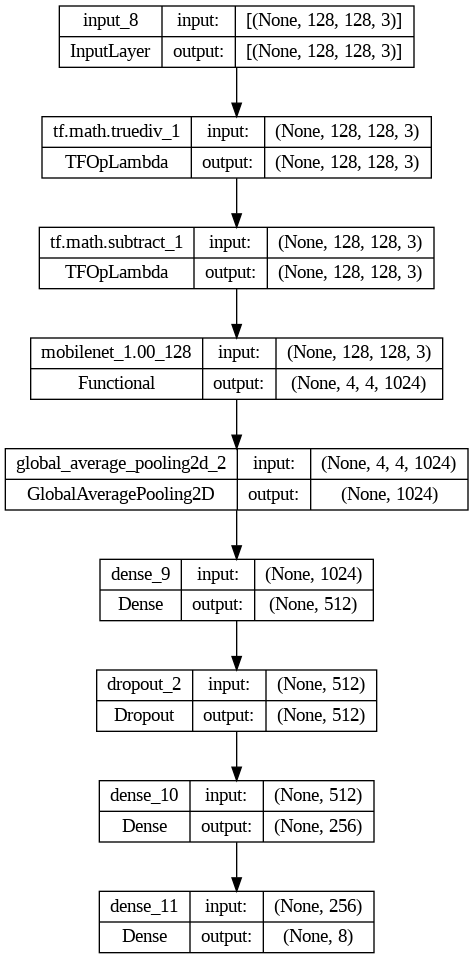

In [66]:
plot_model(mobilenet_model, show_shapes=True)

In [67]:
mobilenet_model.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=[top_k_accuracy])

In [68]:
mobilenet_model_history = mobilenet_model.fit(train_dataset,
                                              validation_data = test_dataset,
                                              callbacks = create_tensorboard_callback("mobilenet_model"),
                                              class_weight = class_weights,
                                              epochs=5)

Epoch 1/5
359/359 [==============================] - 22s 49ms/step - loss: 14.6355 - top_k_accuracy: 0.8455 - val_loss: 1.6337 - val_top_k_accuracy: 0.8995
Epoch 2/5
359/359 [==============================] - 18s 49ms/step - loss: 13.2990 - top_k_accuracy: 0.8907 - val_loss: 1.5721 - val_top_k_accuracy: 0.9130
Epoch 3/5
359/359 [==============================] - 19s 51ms/step - loss: 12.6839 - top_k_accuracy: 0.9078 - val_loss: 1.5035 - val_top_k_accuracy: 0.9271
Epoch 4/5
359/359 [==============================] - 17s 47ms/step - loss: 12.3534 - top_k_accuracy: 0.9137 - val_loss: 1.5123 - val_top_k_accuracy: 0.9245
Epoch 5/5
359/359 [==============================] - 18s 49ms/step - loss: 12.0305 - top_k_accuracy: 0.9217 - val_loss: 1.4737 - val_top_k_accuracy: 0.9254


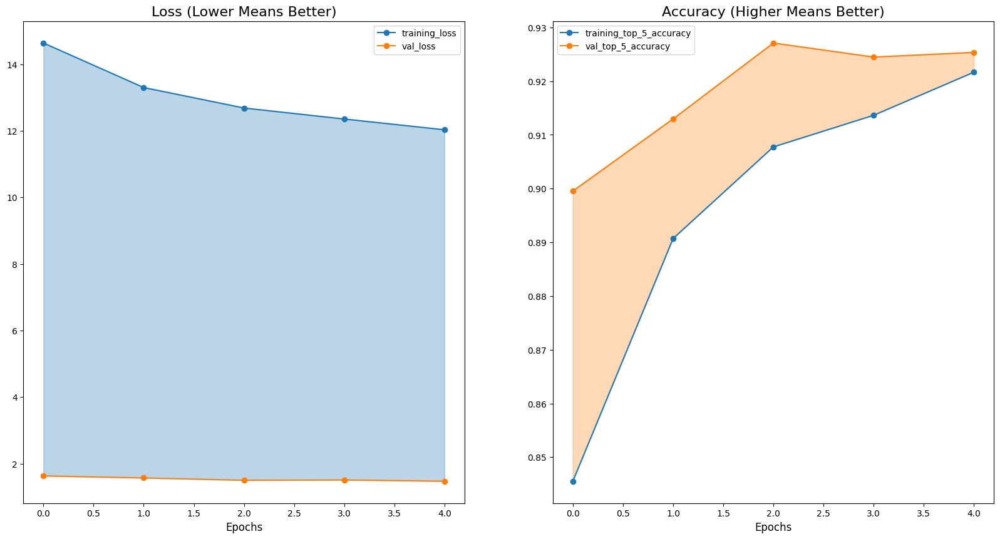

In [69]:
plot_loss_curves(mobilenet_model_history)

In [70]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in test_dataset:
    batch_predictions = mobilenet_model.predict(batch_images)

    batch_predicted_labels = np.argmax(batch_predictions, axis=1)
    batch_labels = np.argmax(batch_labels, axis=1)

    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)


true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 1s 309ms/step


In [71]:
mobilenet_model_results = calculate_results(y_true = true_labels,
                                           y_pred = predicted_labels)
mobilenet_model_results

{'accuracy': 45.744680851063826,
 'precision': 0.45178185163605467,
 'recall': 0.4574468085106383,
 'f1': 0.4438752510085823}

Confusion Matrix:


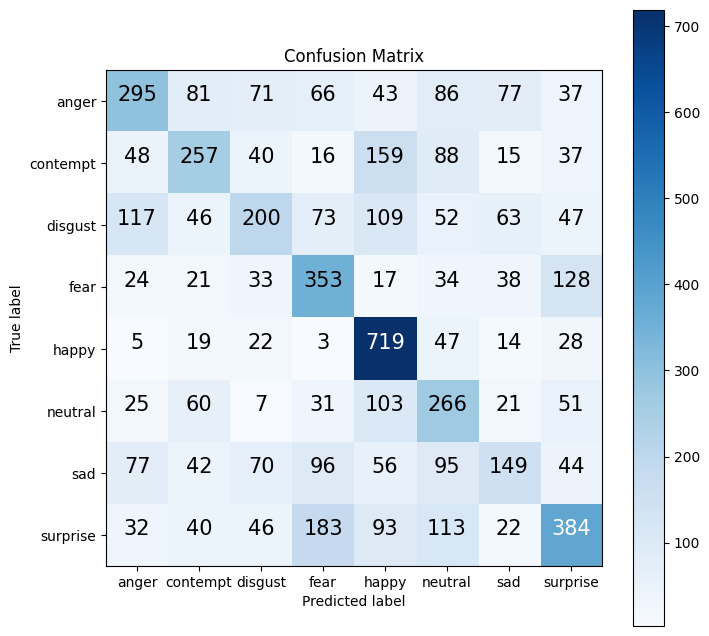

In [72]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names,
                      figsize=(8, 8))

In [73]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.39      0.43       756
           1       0.45      0.39      0.42       660
           2       0.41      0.28      0.33       707
           3       0.43      0.54      0.48       648
           4       0.55      0.84      0.67       857
           5       0.34      0.47      0.40       564
           6       0.37      0.24      0.29       629
           7       0.51      0.42      0.46       913

    accuracy                           0.46      5734
   macro avg       0.44      0.45      0.43      5734
weighted avg       0.45      0.46      0.44      5734



ClassWise accuracy


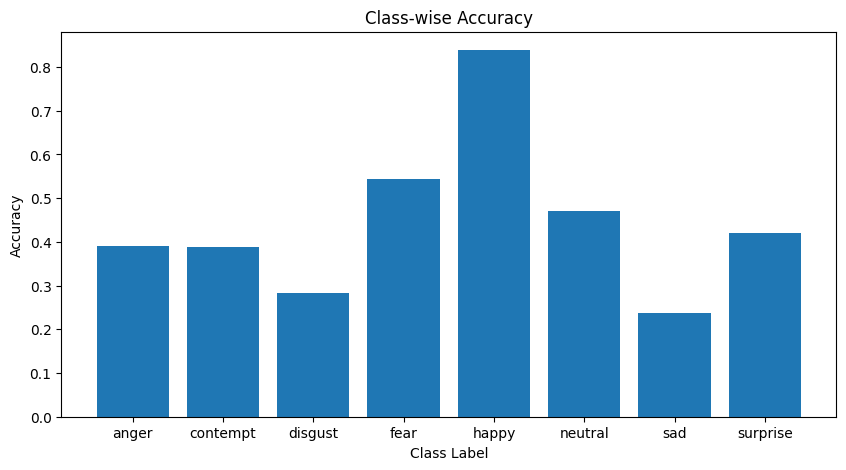

In [74]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names,
                    figsize=(10, 5))

Plot Misclassified images:


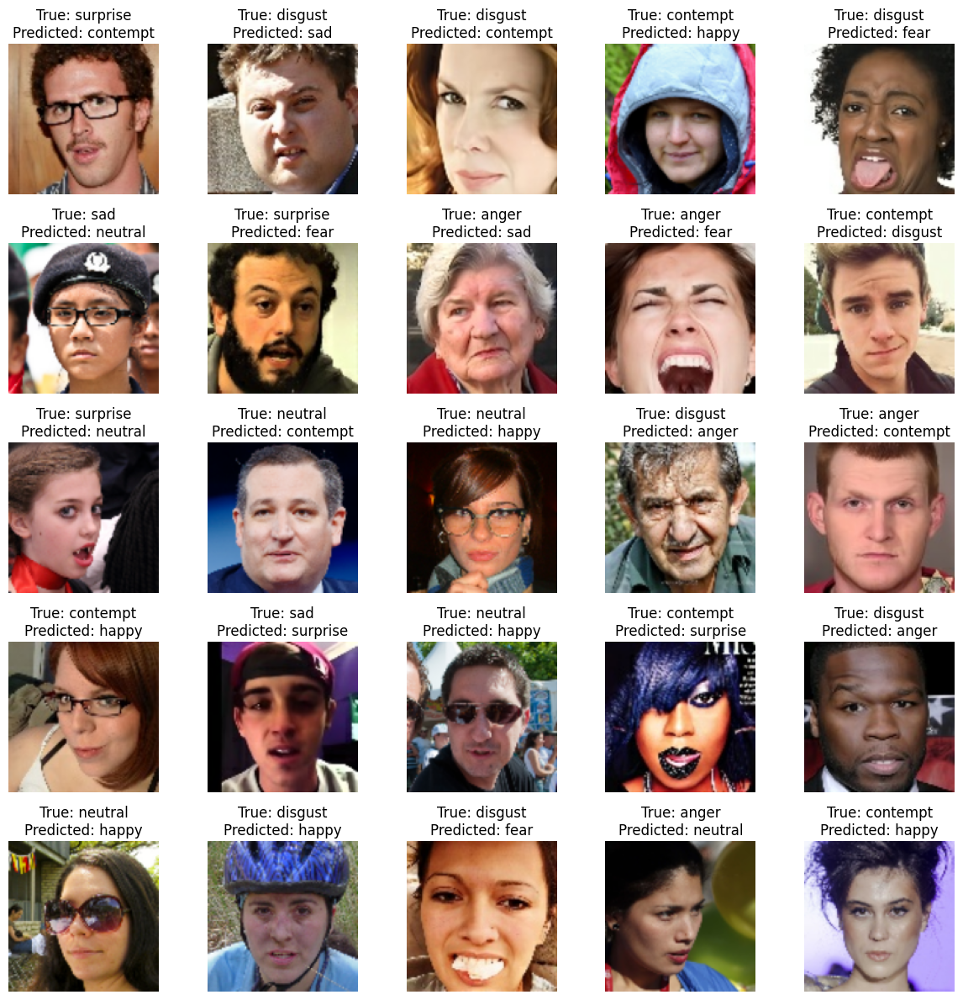

In [75]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

## EfficientNetB0 Model

In [76]:
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input

base_model = EfficientNetB0(weights='imagenet', input_shape=(128, 128, 3), include_top=False) # Do not include the ImageNet classifier at the top.
base_model.trainable = False

input_layer = Input(shape=(128, 128, 3))
preprocess_layer = preprocess_input(input_layer)

x = base_model(preprocess_layer, training=False)

x = GlobalAveragePooling2D()(x)
x = Dense(units=512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(units=256, activation = "relu")(x)

output_layer = Dense(units=num_classes, activation='softmax')(x)

efficientnetB0_model = Model(inputs=input_layer,
                                   outputs=output_layer)

efficientnetB0_model.summary()

16705208/16705208 [==============================] - 0s 0us/step
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 efficientnetb0 (Functional  (None, 4, 4, 1280)        4049571   
 )                                                               
                                                                 
 global_average_pooling2d_3  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_12 (Dense)            (None, 512)               655872    
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                            

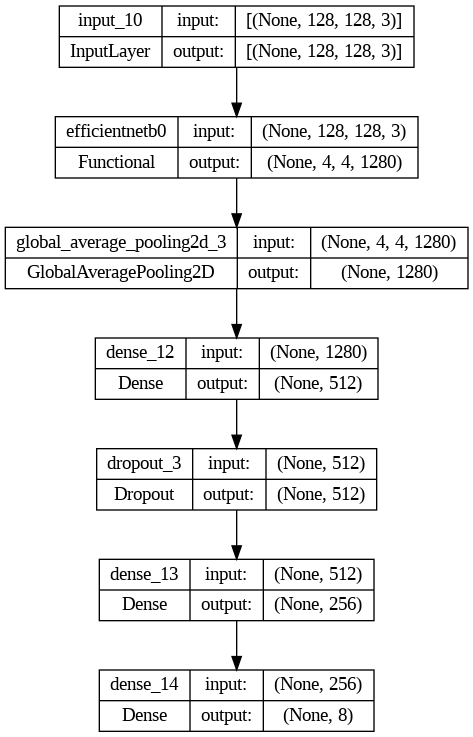

In [77]:
plot_model(efficientnetB0_model, show_shapes=True)

In [82]:
efficientnetB0_model.compile(optimizer='adam',
                            loss='categorical_crossentropy',
                            metrics=[top_k_accuracy])

In [83]:
efficientnetB0_model_history = efficientnetB0_model.fit(train_dataset,
                                                        validation_data = test_dataset,
                                                        callbacks = create_tensorboard_callback("efficientnetB0_model"),
                                                        class_weight = class_weights,
                                                        epochs=5)

Epoch 1/5
359/359 [==============================] - 36s 68ms/step - loss: 11.2710 - top_k_accuracy: 0.9360 - val_loss: 1.5949 - val_top_k_accuracy: 0.9032
Epoch 2/5
359/359 [==============================] - 22s 61ms/step - loss: 10.6663 - top_k_accuracy: 0.9438 - val_loss: 1.6145 - val_top_k_accuracy: 0.8997
Epoch 3/5
359/359 [==============================] - 23s 62ms/step - loss: 10.2187 - top_k_accuracy: 0.9495 - val_loss: 1.6186 - val_top_k_accuracy: 0.9058
Epoch 4/5
359/359 [==============================] - 22s 61ms/step - loss: 9.7486 - top_k_accuracy: 0.9548 - val_loss: 1.6434 - val_top_k_accuracy: 0.9032
Epoch 5/5
359/359 [==============================] - 22s 62ms/step - loss: 9.3698 - top_k_accuracy: 0.9588 - val_loss: 1.6472 - val_top_k_accuracy: 0.9036


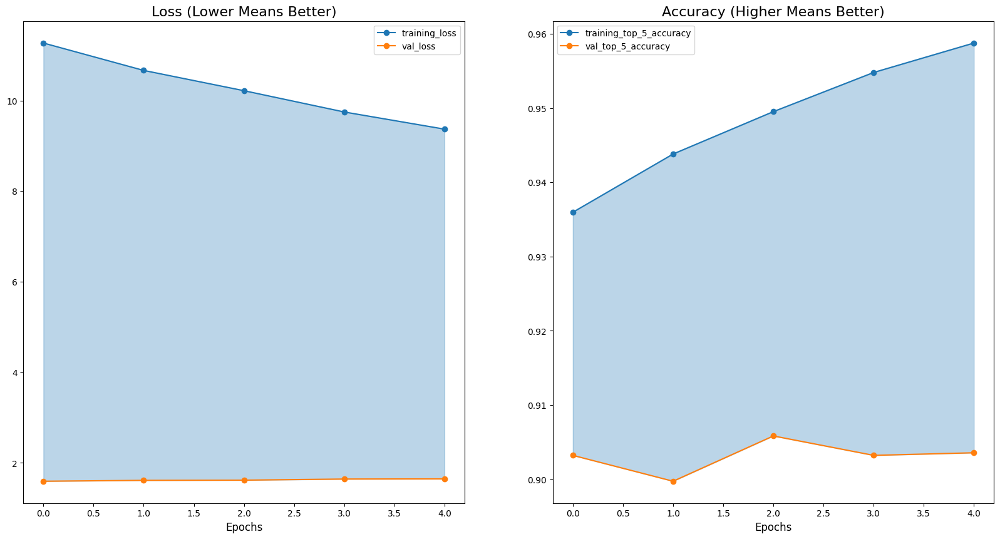

In [84]:
plot_loss_curves(efficientnetB0_model_history)

In [85]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in test_dataset:
    batch_predictions = efficientnetB0_model.predict(batch_images)

    batch_predicted_labels = np.argmax(batch_predictions, axis=1)
    batch_labels = np.argmax(batch_labels, axis=1)

    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)


true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 3s 701ms/step


In [86]:
efficientnetB0_model_results = calculate_results(y_true = true_labels,
                                                 y_pred = predicted_labels)
efficientnetB0_model_results

{'accuracy': 42.83222881060342,
 'precision': 0.4288264397773183,
 'recall': 0.4283222881060342,
 'f1': 0.42249157004257565}

Confusion Matrix:


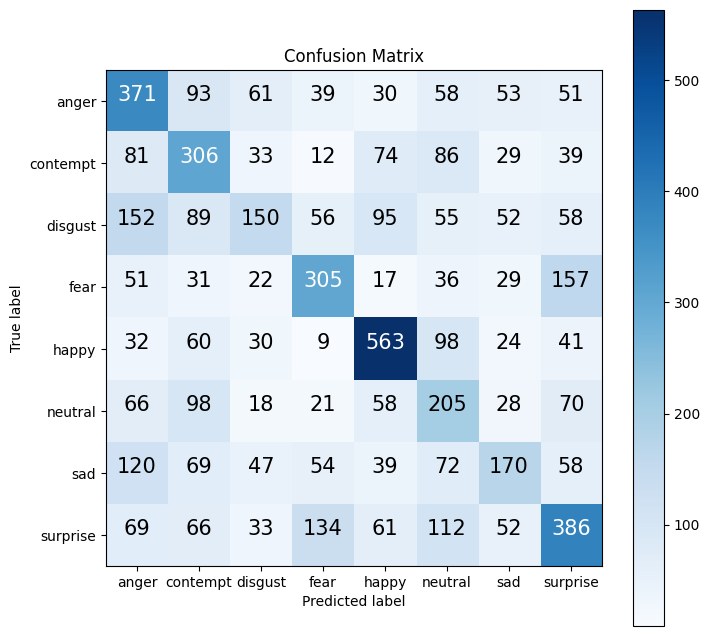

In [87]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names,
                      figsize=(8, 8))

In [88]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

           0       0.39      0.49      0.44       756
           1       0.38      0.46      0.42       660
           2       0.38      0.21      0.27       707
           3       0.48      0.47      0.48       648
           4       0.60      0.66      0.63       857
           5       0.28      0.36      0.32       564
           6       0.39      0.27      0.32       629
           7       0.45      0.42      0.44       913

    accuracy                           0.43      5734
   macro avg       0.42      0.42      0.41      5734
weighted avg       0.43      0.43      0.42      5734



ClassWise accuracy


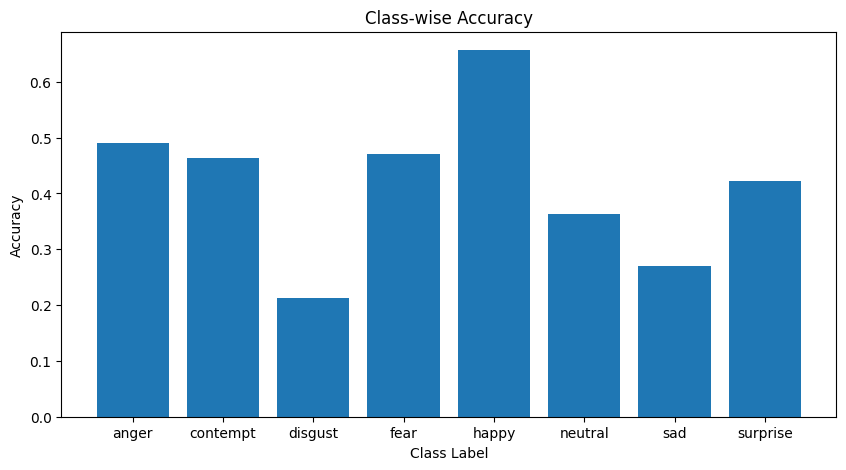

In [89]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names,
                    figsize = (10, 5))

Plot Misclassified images:


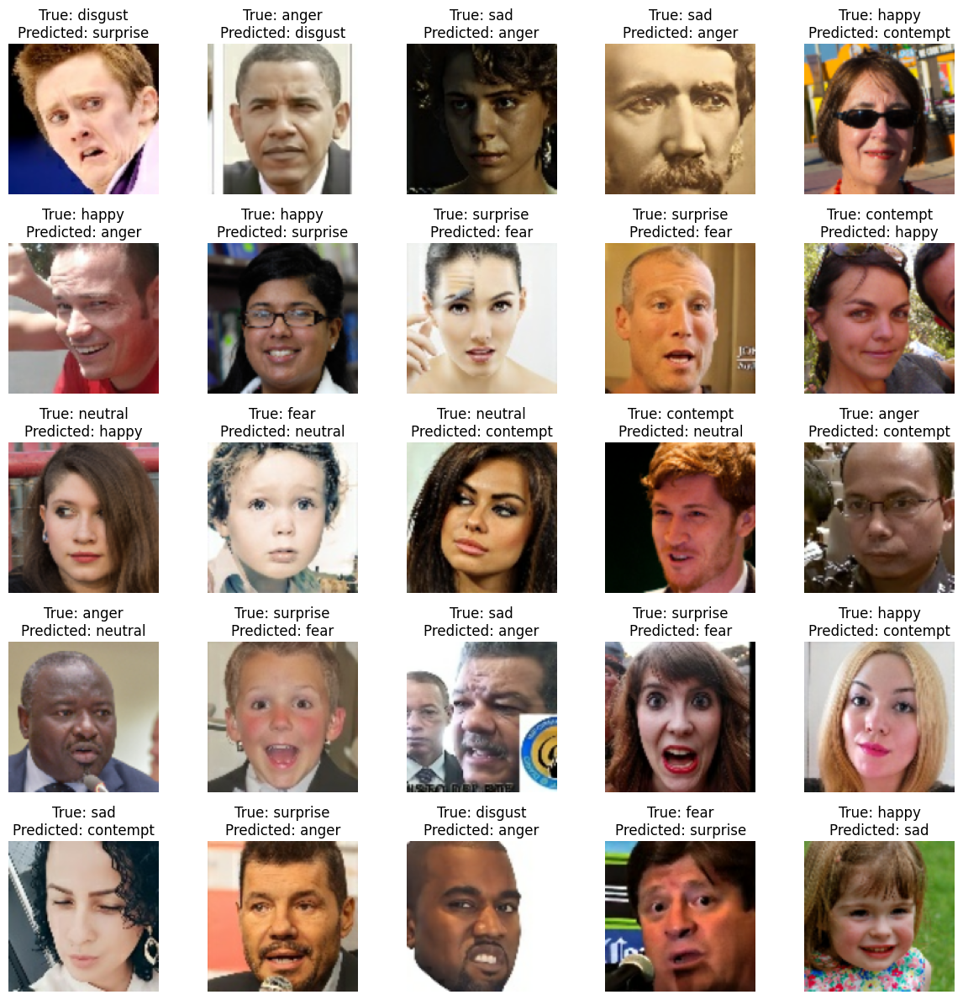

In [90]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Error Analysis

In [91]:
all_model_results = pd.DataFrame({"VGG16_Model": vgg16_model_results,
                                  "Resnet50_Model": Resnet50_model_results,
                                  "Inceptionv3_Model": inceptionv3_model_results,
                                  "mobilenet_Model": mobilenet_model_results,
                                  "efficientnetb0_Model": efficientnetB0_model_results})

all_model_results = all_model_results.transpose()
all_model_results

,accuracy,precision,recall,f1
VGG16_Model,39.291943,0.404055,0.392919,0.395479
Resnet50_Model,41.070806,0.407517,0.410708,0.399963
Inceptionv3_Model,33.606557,0.315645,0.336066,0.317831
mobilenet_Model,45.744681,0.451782,0.457447,0.443875
efficientnetb0_Model,42.832229,0.428826,0.428322,0.422492


In [92]:
all_model_results["accuracy"] = all_model_results["accuracy"]/100

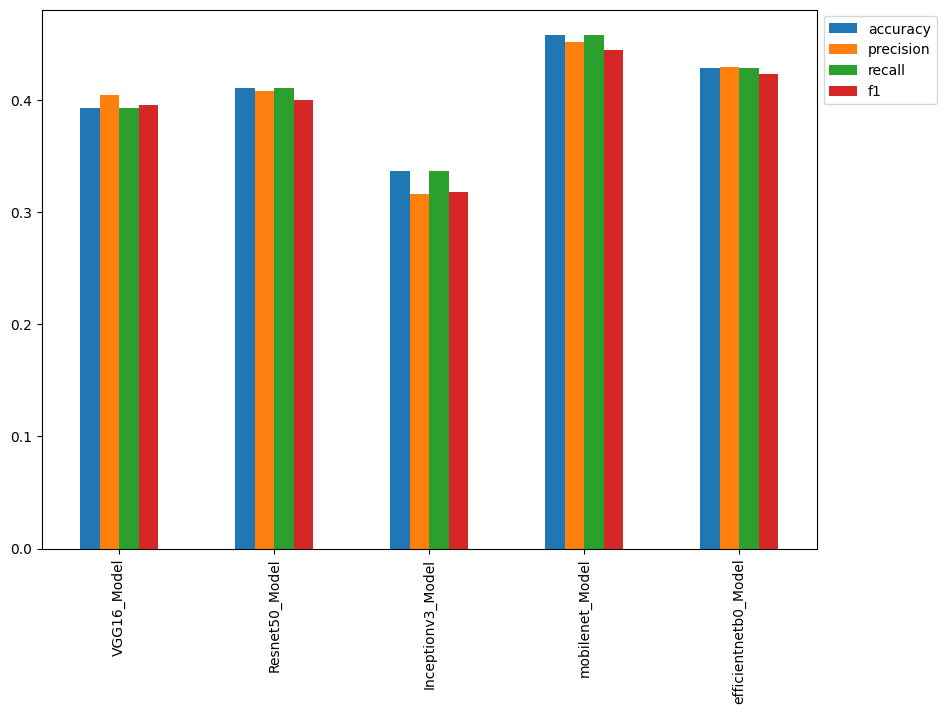

In [93]:
all_model_results.plot(kind="bar", figsize=(10, 7)).legend(bbox_to_anchor=(1.0, 1.0));

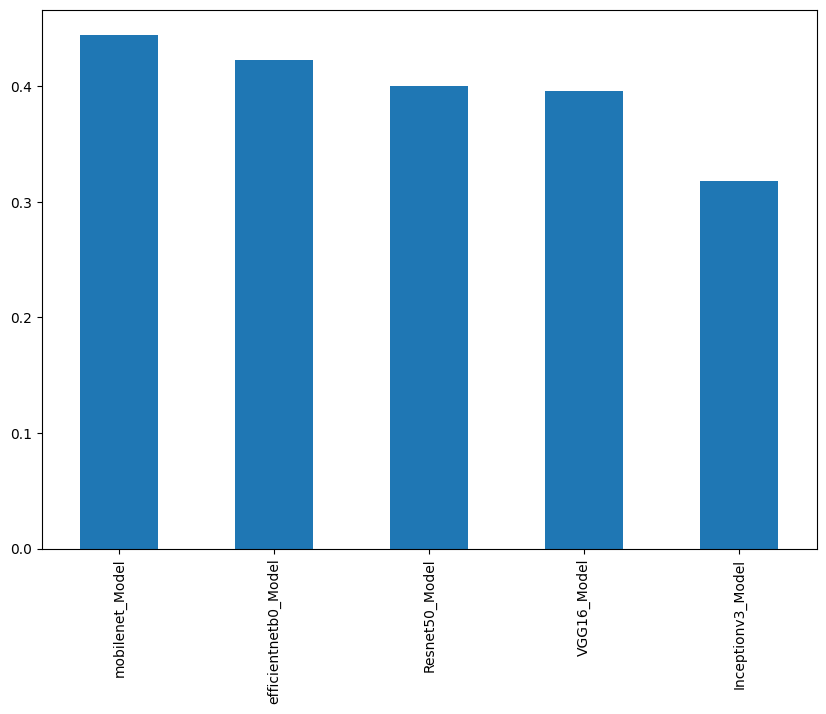

In [94]:
all_model_results.sort_values("f1", ascending=False)["f1"].plot(kind="bar", figsize=(10, 7));

# Implementing different Data augumentation techniques

## 1) Mixup Data augumentation

In [95]:
def mixup(train_dataset_1, train_dataset_2):
    (image_1, label_1), (image_2, label_2) = train_dataset_1, train_dataset_2

    lamda = tfp.distrubutions.Beta(0.4, 0.4)
    lamda = lamda.sample(1)[0]

    image = lamda * image_1 + (1-lamda) * image_2
    label = lamda * label_1 + (1-lamda) * label_2

    return image, label

In [98]:
train_dataset_1 = train_dataset.map()
train_dataset_2 = train_dataset.map()

mixed_dataset = tf.data.Dataset.zip((train_dataset_1, train_dataset_2))

In [ ]:
train_dataset = (
    mixed_dataset
    .map(mixup)
    .prefetch(tf.data.AUTOTUNE)
)

In [ ]:
plt.figure(figsize=(12, 12))
for images, labels in train_dataset.take(1):
    for i in range(25):
        plt.subplot(5, 5, i+1, xticks=[], yticks=[])
        plt.imshow(images[i]/255)
        plt.title(class_names[tf.argmax(labels[i], axis=0)])
        plt.axis("off");

## 2) CutMin Augumentation

In [ ]:
def box(lamda):
    r_x = tf.cast(tfp.distrubutions.Uniform(0, 64).sample(1)[0], dtype=tf.int32)
    r_y = tf.cast(tfp.distrubutions.Uniform(0, 64).sample(1)[0], dtype=tf.int32)

    r_w = tf.cast(64 * tf.math.sqrt(1-lamda), dtype=tf.int32)
    r_h = tf.cast(64 * tf.math.sqrt(1-lamda), dtype=tf.int32)

    r_x = tf.clip_by_values(r_x - r_w//2, 0, 64)
    r_y = tf.clip_by_values(r_y - r_h//2, 0, 64)

    x_b_r = tf.clip_by_values(r_x + r_w//2, 0, 64)
    y_b_r = tf.clip_by_values(r_y + r_h//2, 0, 64)

    r_w = x_b_r - r_x
    if(r_w == 0):
        r_w = 1

    r_h = y_b_r - r_y
    if(r_h == 0):
        r_h = 1

    return r_y, r_x, r_h, r_w

In [ ]:
def cutmix(train_dataset_1, train_dataset_2):
    (image_1, label_1), (image_2, label_2) = train_dataset_1, train_dataset_2

    lamda = tfp.distrubutions.Beta(2, 2)
    lamda = lamda.sample(1)[0]

    r_y, r_x, r_h, r_w = box(lamda)
    crop_1 = tf.image.crop_to_bounding_box(image_2, r_y, r_x, r_h, r_w)
    pad_1 = tf.image.pad_to_bounding_box(crop_2, r_y, r_x, 64, 64)

    crop_2 = tf.image.crop_to_bounding_box(image_1, r_y, r_x, r_h, r_w)
    pad_2 = tf.image.pad_to_bounding_box(crop_1, r_y, r_x, 64, 64)

    image = image_1 - pad_1 + pad_2

    lamda = tf.cast(1 - (r_w * r_h)/(64 * 64), dtype=tf.float32)
    label = lamda * tf.cast(label_1, dtype=tf.float32) + (1-lamda)*tf.cast(label_2, dtype=tf.float32)

    return image, label

In [ ]:
train_dataset_1 = train_dataset.map(buffer_size = 8, reshuffle_each_iteration = True)
train_dataset_2 = train_dataset.map(buffer_size = 8, reshuffle_each_iteration = True)

mixed_dataset = tf.data.Dataset.zip((train_dataset_1, train_dataset_2))

In [ ]:
train_dataset = (
    mixed_dataset
    .map(cutmix)
    .prefetch(tf.data.AUTOTUNE)
)

In [ ]:
plt.figure(figsize=(12, 12))
for images, labels in train_dataset.take(1):
    for i in range(25):
        plt.subplot(5, 5, i+1, xticks=[], yticks=[])
        plt.imshow(images[i]/255)
        plt.title(class_names[tf.argmax(labels[i], axis=0)])
        plt.axis("off");

# Model at inference

In [99]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [100]:
mobilenet_model.save("/content/drive/MyDrive/Facial_Expression_Recognition")

In [102]:
from tensorflow.keras.models import Model, load_model

model = load_model("/content/drive/MyDrive/Facial_Expression_Recognition", custom_objects={'top_k_accuracy': top_k_accuracy})
class_names = ['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

def prediction(image_path):
    image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
    image = tf.cast(tf.image.resize(image, [128, 128]), dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)

    predictions = model.predict(image)
    top_prediction = np.argmax(predictions, axis=1)[0]
    confidence = predictions[0][top_prediction]
    predicted_class = class_names[top_prediction]

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.2f}")

In [103]:
prediction("/content/dataset/train/anger/ffhq_1849.png")

1/1 [==============================] - 1s 908ms/step
Predicted Class: neutral
Confidence: 0.26


# Tensorboard

In [104]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

In [120]:
! cp -r /content/logs /content/drive/MyDrive

# Hugging Face

In [105]:
! pip install huggingface_hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 5.0 MB/s eta 0:00:00


In [106]:
from huggingface_hub import notebook_login
notebook_login()

In [109]:
model = load_model("/content/drive/MyDrive/Facial_Expression_Recognition", custom_objects={'top_k_accuracy': top_k_accuracy})

In [111]:
from huggingface_hub.keras_mixin import push_to_hub_keras
push_to_hub_keras(model = model, repo_id = "DriveMyScream/Facial_Expression_Recognition")

fingerprint.pb:   0%|          | 0.00/56.0 [00:00<?, ?B/s]

keras_metadata.pb:   0%|          | 0.00/294k [00:00<?, ?B/s]

Upload 4 LFS files:   0%|          | 0/4 [00:00<?, ?it/s]

variables.data-00000-of-00001:   0%|          | 0.00/15.6M [00:00<?, ?B/s]

saved_model.pb:   0%|          | 0.00/1.42M [00:00<?, ?B/s]

'https://huggingface.co/DriveMyScream/Facial_Expression_Recognition/tree/main/'

In [114]:
from huggingface_hub import from_pretrained_keras
loaded_model = from_pretrained_keras("DriveMyScream/Facial_Expression_Recognition", custom_objects={'top_k_accuracy': top_k_accuracy})

config.json not found in HuggingFace Hub.


Fetching 8 files:   0%|          | 0/8 [00:00<?, ?it/s]

In [115]:
from tensorflow.keras.models import Model, load_model

class_names = ['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

def prediction(image_path):
    image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
    image = tf.cast(tf.image.resize(image, [128, 128]), dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)

    predictions = loaded_model.predict(image)
    top_prediction = np.argmax(predictions, axis=1)[0]
    confidence = predictions[0][top_prediction]
    predicted_class = class_names[top_prediction]

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.2f}")

In [116]:
prediction("/content/dataset/train/anger/ffhq_1849.png")

1/1 [==============================] - 1s 533ms/step
Predicted Class: neutral
Confidence: 0.26


# Tensorflow Lite

In [118]:
import tensorflow as tf

model = load_model("/content/drive/MyDrive/Facial_Expression_Recognition", custom_objects={'top_k_accuracy': top_k_accuracy})

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
converter._experimental_lower_tensor_list_ops = False
tflite_model = converter.convert()

tflite_output_path = "Facial_Expression_Recognition.tflite"
with open(tflite_output_path, "wb") as f:
    f.write(tflite_model)

In [119]:
model_path = "/content/Facial_Expression_Recognition.tflite"
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

class_names = ['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

image_path = "/content/dataset/train/anger/ffhq_1849.png"
image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
image = tf.cast(tf.image.resize(image, [128, 128]), dtype=tf.float32)
image = tf.expand_dims(image, axis=0)

interpreter.set_tensor(input_details[0]['index'], image)
interpreter.invoke()
output_data = interpreter.get_tensor(output_details[0]['index'])
probabilities = tf.nn.softmax(output_data)[0]
top_prediction = np.argmax(probabilities)
confidence = probabilities[top_prediction]
predicted_class = class_names[top_prediction]

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {confidence:.2f}")

Predicted Class: neutral
Confidence: 0.14
